In [1]:
#Import packages
import os
import glob
import json
import pickle
#from tqdm import tqdm

import nilearn
import nibabel as nib
from nibabel import load
from nibabel.gifti import GiftiDataArray, GiftiImage

from nilearn import image as nimg
from nilearn import plotting as nplot
from nilearn.glm.first_level import FirstLevelModel, make_first_level_design_matrix, run_glm
from nilearn.glm.second_level import make_second_level_design_matrix, SecondLevelModel
from nilearn.glm import fdr_threshold,threshold_stats_img
from nilearn.glm.contrasts import compute_contrast, compute_fixed_effects

from bids.layout import BIDSLayout, parse_file_entities

# import cortex
# from cortex import fmriprep

from nipype.interfaces.workbench.base import WBCommand
from nipype.algorithms import modelgen
from nipype.interfaces.base import Bunch

import scipy.stats as stats

#from statsmodels.api import OLS

import hcp_utils as hcp

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image
%matplotlib inline
#! module load openmind/hcp-workbench/1.2.3

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


In [2]:
host = 'om'
#host = 'local'

In [4]:
#list all effect size outputs from the fixed effects

if host == 'om':
    root = '../../derivatives'
elif host == 'local':
    root = '..'
#fixed_effects_all = glob.glob(f'{root}/second_level/*_effect_size_fx.dscalar.nii')
#fixed_effects_all = glob.glob(f'{root}/second_level_FD0.2/*_effect_size_fx.dscalar.nii')
#fixed_effects_all = glob.glob(f'{root}/second_level_FD0.3/*_effect_size_fx.dscalar.nii')
#fixed_effects_all = glob.glob(f'{root}/second_level_FD0.4/*_effect_size_fx.dscalar.nii')
#fixed_effects_all = glob.glob(f'{root}/second_level_FD0.5/*_effect_size_fx.dscalar.nii')
#fixed_effects_all = glob.glob(f'{root}/second_level_FD0.6/*_effect_size_fx.dscalar.nii')


In [3]:
pd.DataFrame({t:{fd: len(val) for fd, val in files.items()} for t, files in second_level_effects.items()})

NameError: name 'second_level_effects' is not defined

In [19]:
second_level_effects.keys()

dict_keys([0.2, 0.4, 0.6])

In [18]:
fixed_effects

{'vowel': {0.2: ['vowel'], 0.4: ['vowel'], 0.6: ['vowel']},
 'nwr': {0.2: ['nwr'], 0.4: ['nwr'], 0.6: ['nwr']},
 'emosent': {0.2: ['emosent'], 0.4: ['emosent'], 0.6: ['emosent']},
 'pataka': {0.2: ['pataka'], 0.4: ['pataka'], 0.6: ['pataka']}}

In [21]:
t

'pataka'

In [26]:
fx.values()

dict_values([['../../derivatives/second_level/sub-844_ses-1_task-vowel_effect_size_fx.dscalar.nii', '../../derivatives/first_level/speech_v_silence_effects_size/sub-voice849_ses-1_task-vowel_run-1_fsLR_91k_speechvssilence_effect_size.dscalar.nii', '../../derivatives/first_level/speech_v_silence_effects_size/sub-voice850_ses-1_task-vowel_run-1_fsLR_91k_speechvssilence_effect_size.dscalar.nii', '../../derivatives/first_level/speech_v_silence_effects_size/sub-voice854_ses-1_task-vowel_run-1_fsLR_91k_speechvssilence_effect_size.dscalar.nii', '../../derivatives/second_level/sub-857_ses-1_task-vowel_effect_size_fx.dscalar.nii', '../../derivatives/first_level/speech_v_silence_effects_size/sub-voice859_ses-1_task-vowel_run-2_fsLR_91k_speechvssilence_effect_size.dscalar.nii', '../../derivatives/second_level/sub-860_ses-1_task-vowel_effect_size_fx.dscalar.nii', '../../derivatives/second_level/sub-867_ses-1_task-vowel_effect_size_fx.dscalar.nii', '../../derivatives/second_level/sub-872_ses-1_task

In [4]:
with open("second_level_effects_FD_sweep", "rb") as fp:   # Unpickling
    second_level_effects = pickle.load(fp)

second_level_df = pd.DataFrame(second_level_effects)

task_list = list(second_level_df.index)
fd_sweep = list(second_level_df.columns)

fixed_effects = {}

for t in task_list:
    fixed_effects[t] = {}
    for fd, fx in second_level_effects.items():        
        fixed_effects[t][fd] = fx[t]
        #fixed_effects[t][fd] = [f for f in fx if t in f]
#         if t in fx:
#             tmp.append(fx)
#          = tmp

In [8]:
#currently analyze by task, could loop but im not
#task = 'nwr'

In [9]:
#{t:f for f in second_level_effects[0.2] for t in task_list if t in f}

{'vowel': 'vowel', 'nwr': 'nwr', 'emosent': 'emosent', 'pataka': 'pataka'}

In [38]:
#loading my covariates and putting into the second level design matrix
pheno = pd.read_csv('bdi_scores.csv', index_col=0)[['voice_id','age','sex','beckdepressionii_total']].reset_index(drop=True)
pheno = pheno[pheno.voice_id != 955] #exclude this subject

#satra said I should de-mean BDI total score
pheno.beckdepressionii_total = pheno.beckdepressionii_total - pheno.beckdepressionii_total.mean()
pheno.age = pheno.age - pheno.age.mean() # so I demeaned everything for now...

sub_info = pheno.rename(columns={'voice_id':'subject_label'})

second_level_betas = {f:{t: [] for t in task_list} for f in fd_sweep}

for task in task_list:
    for fd in fd_sweep:
        #filter to desired tasks
        #fixed_effects = [f for f in second_level_effects[0.2] if task in f]
        fixed_effects = second_level_df[fd][task]

        #load the data and put into a dataframe
        effect_data = np.squeeze([nib.load(effect).get_fdata(dtype='f4') for effect in fixed_effects])
        Y = pd.DataFrame(effect_data)

        #created the expected inputs for the nilearn function, printed below. Seemed redundant

        if host == 'om':
            sub_list = [int(parse_file_entities(f)['subject'].replace('voice','')) for f in fixed_effects]
        elif host == 'local':
            sub_list = [int(f.split('sub-')[1].split('_ses')[0]) for f in fixed_effects]
        
        second_level_design_matrix = make_second_level_design_matrix(
            sub_list, sub_info
        )
        
        models = Y.apply(lambda fx: OLS(fx, second_level_design_matrix).fit())
        
        second_level_betas[fd][task] = [m.params for m in models]


/om2/user/rfbrito/miniconda/envs/imaging_with_statsmodel/lib/python3.11/site-packages/nilearn/glm/first_level/design_matrix.py:476: UserWarning: Attention: Design matrix is singular. Aberrant estimates are expected.
  warn('Attention: Design matrix is singular. Aberrant estimates '
/om2/user/rfbrito/miniconda/envs/imaging_with_statsmodel/lib/python3.11/site-packages/nilearn/glm/first_level/design_matrix.py:476: UserWarning: Attention: Design matrix is singular. Aberrant estimates are expected.
  warn('Attention: Design matrix is singular. Aberrant estimates '


In [55]:
dict_second_level_betas = {f:{t: [] for t in task_list} for f in fd_sweep}
for fd in fd_sweep: 
    for task in task_list:
        dict_second_level_betas[fd][task] = pd.DataFrame(second_level_betas[fd][task]) 

In [59]:
with open("dict_second_level_betas_FD_sweep", "wb") as fp:   #Pickling
    pickle.dump(dict_second_level_betas, fp)

In [5]:
with open("dict_second_level_betas_FD_sweep", "rb") as fp:   # Unpickling
    dict_second_level_betas = pickle.load(fp)

In [12]:
task

'vowel'

inf

In [17]:
task = 'vowel'
fd = 0.4
betas = dict_second_level_betas[fd][task]
n_sub = len(fixed_effects[task][fd])
covariate = 'beckdepressionii_total'

betas = dict_second_level_betas[fd][task]
betas_z = betas.apply(stats.zscore)
thresholds = betas_z.apply(lambda z: fdr_threshold(z,alpha=0.05))
betas_z


,age,sex,beckdepressionii_total,intercept
0,-0.500637,1.351932,1.004167,-1.174262
1,0.165388,-0.289102,0.050995,-0.005360
2,-2.847128,0.333544,-0.692202,3.177433
3,-1.126586,0.651623,0.838199,-0.203726
4,2.118141,0.016280,-2.005694,-2.570827
...,...,...,...,...
91277,0.507866,-0.371804,-0.377820,-0.197061
91278,-1.204873,-1.612688,0.666021,-0.169753
91279,-0.598899,-0.874200,0.209121,-0.421987
91280,0.162728,-0.498033,-0.328965,-0.312127


In [20]:
betas_z.max()

age                       6.551750
sex                       7.403468
beckdepressionii_total    6.852597
intercept                 7.614542
dtype: float64

In [ ]:
# for fd,task_data in dict_second_level_betas.items():
#     for task, betas in task_data.items():
#         n_sub = len(second_level_df[fd][task])

# task = 'vowel'
# fd = 0.4
# betas = dict_second_level_betas[fd][task]
# n_sub = len(fixed_effects[task][fd])
# covariate = 'beckdepressionii_total'
# vmax = 150
# #title = 

# nplot.plot_surf_stat_map(
#     hcp.mesh.inflated, hcp.cortex_data(betas[covariate]), hemi='left', threshold=thresholds[covariate],
#     symmetric_cbar = False,
#     colorbar=True,
#     title = f'{task} with FD<={fd}, N={n_sub}. LH, w.r.t. {covariate}',
#     title_font_size=30,#vmax = vmax,
#     bg_map=hcp.mesh.sulc)

# nplot.plot_surf_stat_map(
#     hcp.mesh.inflated_left, hcp.left_cortex_data(betas[covariate]), view= 'lateral',
#     hemi='right', threshold=thresholds[covariate],
#     symmetric_cbar = False,
#     colorbar=True,#vmax = vmax,
#     bg_map=hcp.mesh.sulc_left)

# nplot.plot_surf_stat_map(
#     hcp.mesh.inflated, hcp.cortex_data(betas[covariate]), hemi='right', threshold=thresholds[covariate],
#     symmetric_cbar = False,
#     colorbar=True,
#     title = f'{task} with FD<={fd}, N={n_sub}. RH, w.r.t. {covariate}',#vmax = vmax,
#     bg_map=hcp.mesh.sulc)

# nplot.plot_surf_stat_map(
#     hcp.mesh.inflated_right, hcp.left_cortex_data(betas[covariate]), view= 'lateral',
#     hemi='left', threshold=thresholds[covariate],
#     symmetric_cbar = False,
#     colorbar=True,#vmax = vmax,
#     bg_map=hcp.mesh.sulc_right)

# nplot.show()


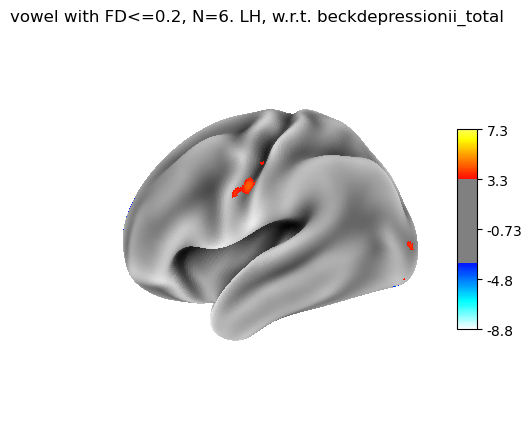

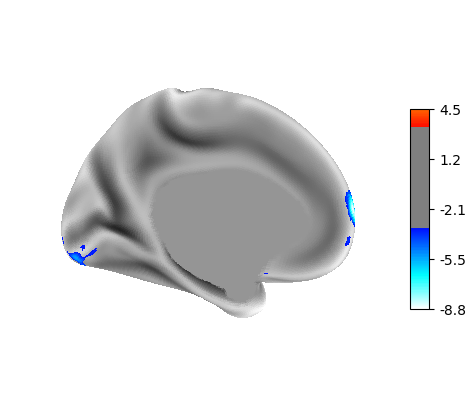

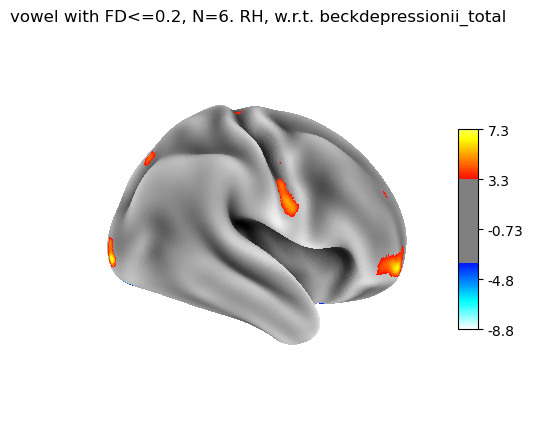

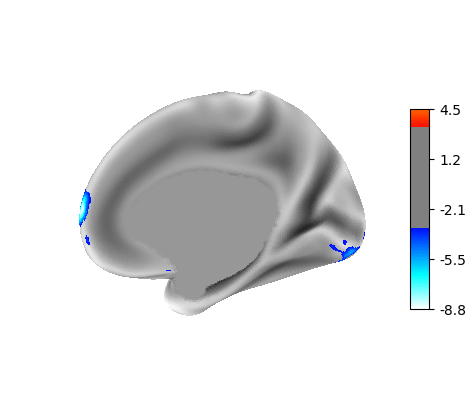

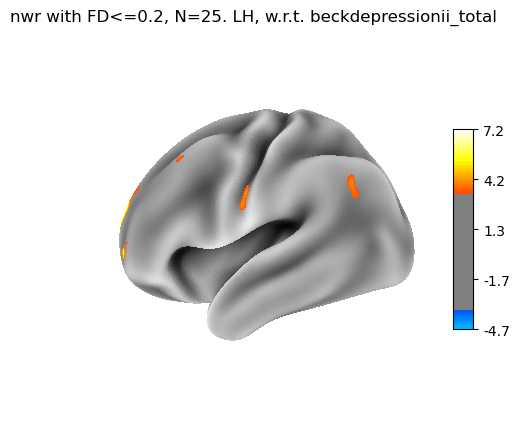

...

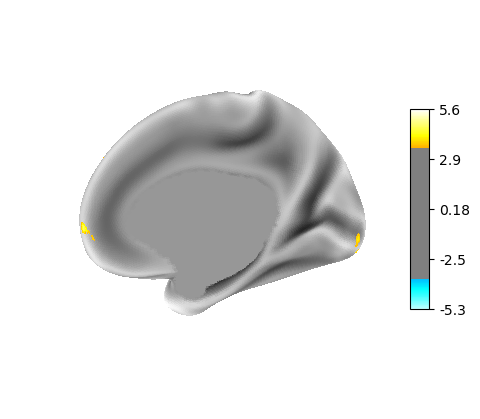

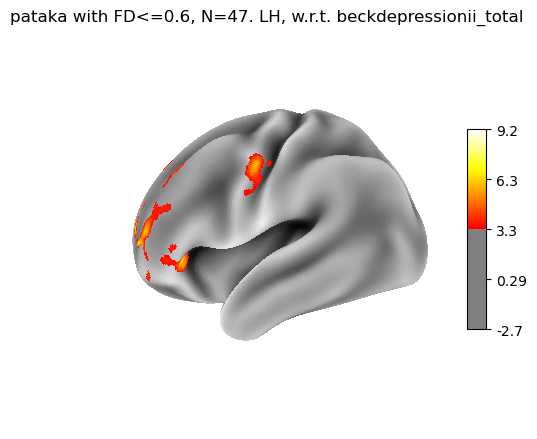

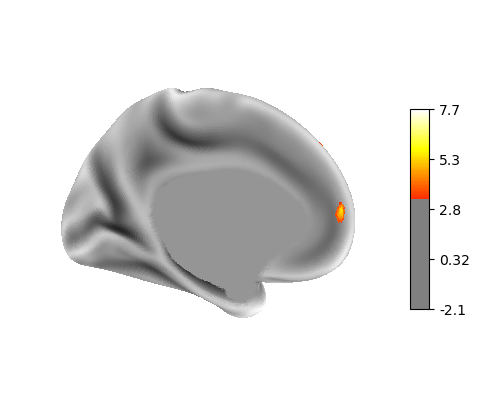

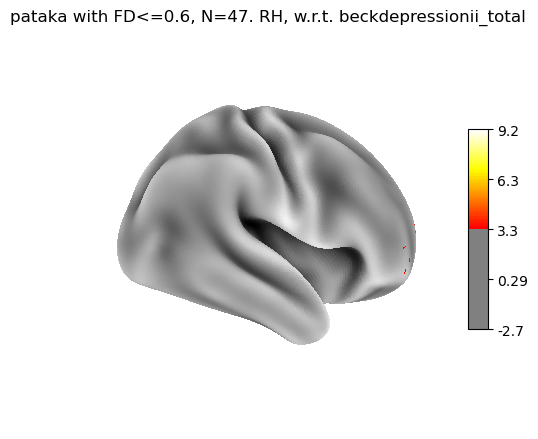

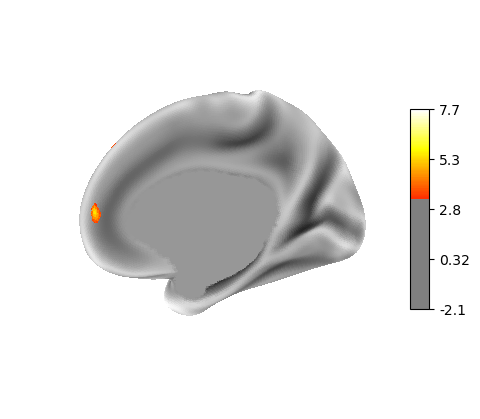

In [23]:

covariate = 'beckdepressionii_total'
#betas = dict_second_level_betas[fd][task]
#vmax = 150

for fd,task_data in dict_second_level_betas.items():
    for task, betas in task_data.items():
        betas = dict_second_level_betas[fd][task]
        betas_z = betas.apply(stats.zscore)
        thresholds = betas_z.apply(lambda z: fdr_threshold(z,alpha=0.05))
        
        n_sub = len(second_level_df[fd][task])

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(betas_z[covariate]), hemi='left', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,
            title = f'{task} with FD<={fd}, N={n_sub}. LH, w.r.t. {covariate}',
            title_font_size=30,#vmax = vmax,
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_left, hcp.left_cortex_data(betas_z[covariate]), view= 'lateral',
            hemi='right', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax,
            bg_map=hcp.mesh.sulc_left)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated, hcp.cortex_data(betas_z[covariate]), hemi='right', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,
            title = f'{task} with FD<={fd}, N={n_sub}. RH, w.r.t. {covariate}',#vmax = vmax,
            bg_map=hcp.mesh.sulc)

        nplot.plot_surf_stat_map(
            hcp.mesh.inflated_right, hcp.left_cortex_data(betas_z[covariate]), view= 'lateral',
            hemi='left', threshold=thresholds[covariate],
            symmetric_cbar = False,
            colorbar=True,#vmax = vmax,
            bg_map=hcp.mesh.sulc_right)

        nplot.show()


In [24]:
a

NameError: name 'a' is not defined

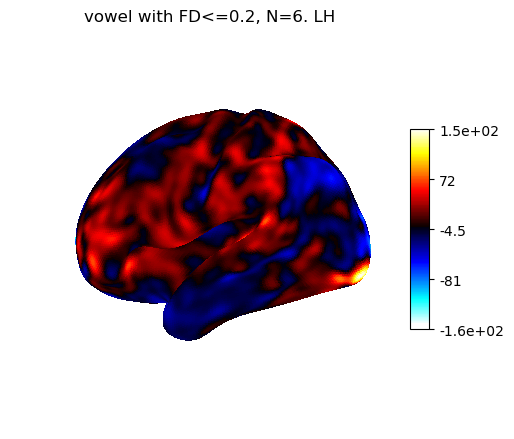

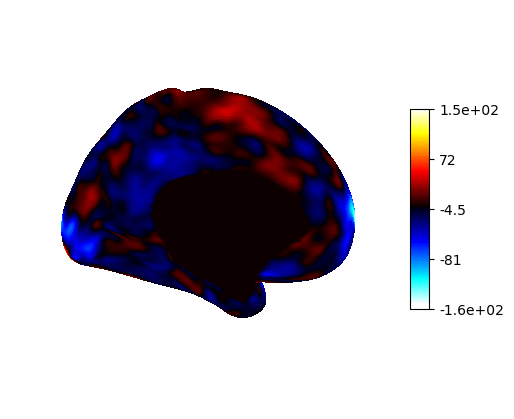

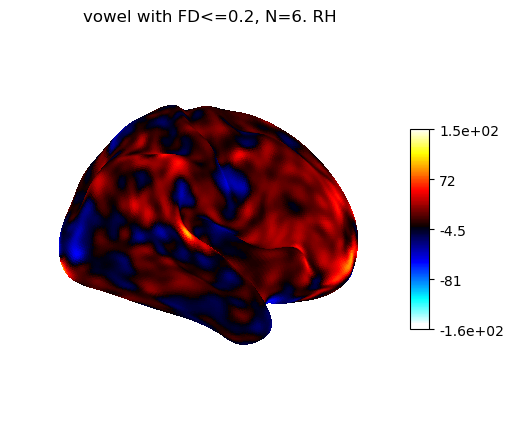

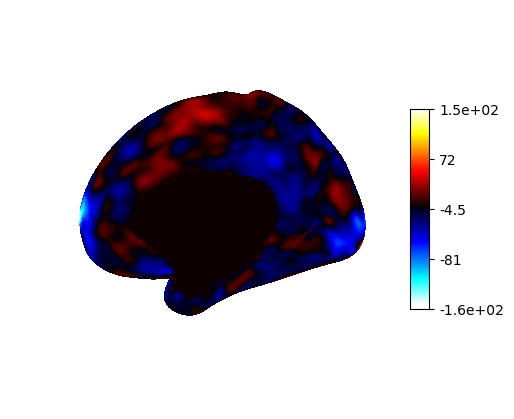

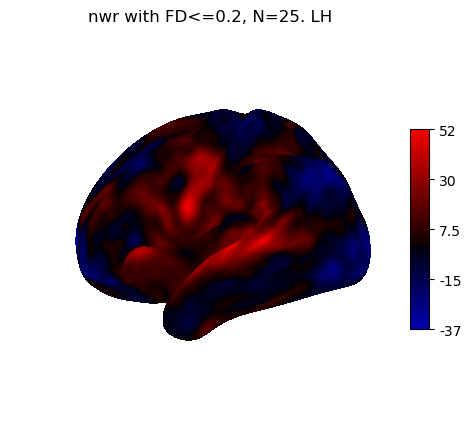

...

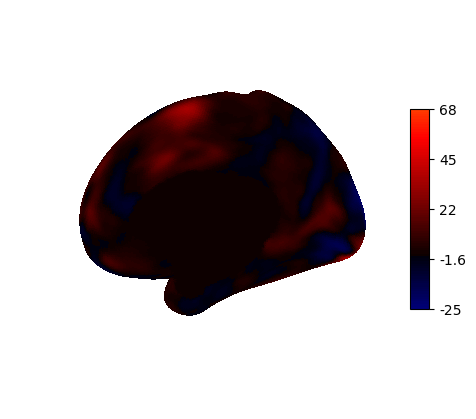

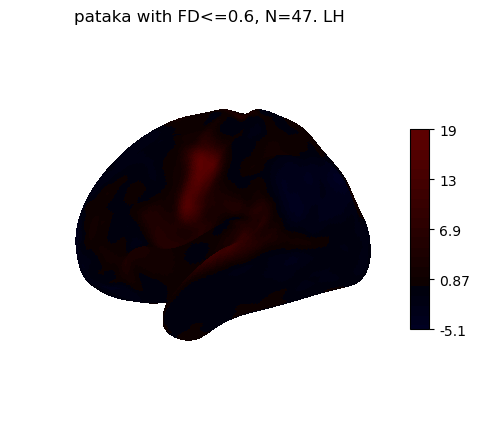

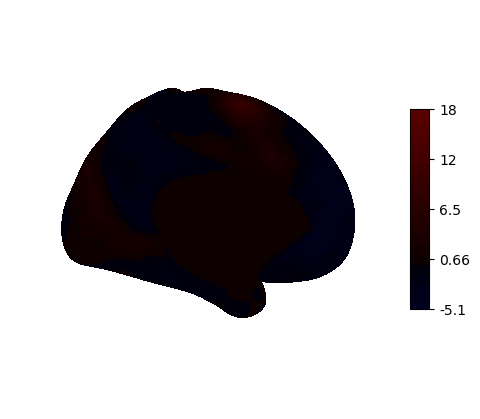

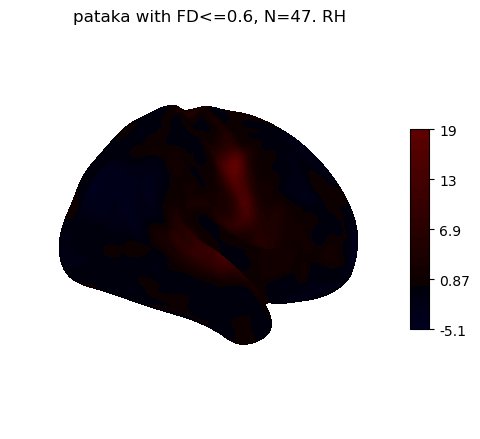

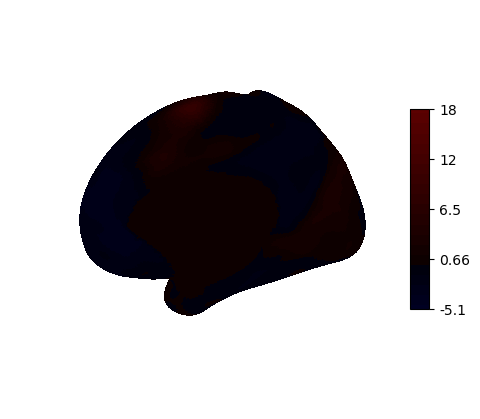

In [80]:

# covariate = 'intercept'
# vmax = 150

# for fd,task_data in dict_second_level_betas.items():
#     for task, betas in task_data.items():
#         n_sub = len(second_level_df[fd][task])

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated, hcp.cortex_data(betas[covariate]), hemi='left', threshold=thresholds[covariate],
#             symmetric_cbar = False,
#             colorbar=True,
#             title = f'{task} with FD<={fd}, N={n_sub}. LH',
#             title_font_size=30,
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc)

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated_left, hcp.left_cortex_data(betas[covariate]), view= 'lateral',
#             hemi='right', threshold=thresholds[covariate],
#             symmetric_cbar = False,
#             colorbar=True,
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc_left)

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated, hcp.cortex_data(betas[covariate]), hemi='right', threshold=thresholds[covariate],
#             symmetric_cbar = False,
#             colorbar=True,
#             title = f'{task} with FD<={fd}, N={n_sub}. RH',
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc)

#         nplot.plot_surf_stat_map(
#             hcp.mesh.inflated_right, hcp.left_cortex_data(betas[covariate]), view= 'lateral',
#             hemi='left', #threshold=3.5,
#             symmetric_cbar = False,
#             colorbar=True,
#             vmax = vmax,
#             bg_map=hcp.mesh.sulc_right)

#         nplot.show()


In [ ]:
second_level_betas_df = pd.DataFrame(second_level_betas)

In [29]:
effect_data = np.squeeze([nib.load(effect).get_fdata(dtype='f4') for effect in fixed_effects])
Y = pd.DataFrame(effect_data)

#loading my covariates and putting into the second level design matrix
pheno = pd.read_csv('bdi_scores.csv', index_col=0)[['voice_id','age','sex','beckdepressionii_total']].reset_index(drop=True)
pheno = pheno[pheno.voice_id != 955] #exclude this subject

#satra said I should de-mean BDI total score
pheno.beckdepressionii_total = pheno.beckdepressionii_total - pheno.beckdepressionii_total.mean()
pheno.age = pheno.age - pheno.age.mean() # so I demeaned everything for now...

#created the expected inputs for the nilearn function, printed below. Seemed redundant

if host == 'om':
    sub_list = [int(parse_file_entities(f)['subject'].replace('voice','')) for f in fixed_effects]
elif host == 'local':
    sub_list = [int(f.split('sub-')[1].split('_ses')[0]) for f in fixed_effects]
sub_info = pheno.rename(columns={'voice_id':'subject_label'})

second_level_design_matrix = make_second_level_design_matrix(
    sub_list, sub_info
)

models = Y.apply(lambda fx: OLS(fx, second_level_design_matrix).fit())

second_level_betas = [m.params for m in models]
#second_level_betas = np.array(second_level_betas)

/om2/user/rfbrito/miniconda/envs/imaging_with_statsmodel/lib/python3.11/site-packages/nilearn/glm/first_level/design_matrix.py:476: UserWarning: Attention: Design matrix is singular. Aberrant estimates are expected.
  warn('Attention: Design matrix is singular. Aberrant estimates '


In [216]:
# Y_mmp = pd.DataFrame(hcp.parcellate(Y.to_numpy(), hcp.mmp))
# Y_mmp.head(10)

In [31]:
#use the statsmodel OLS method to do the random effects, which is just fitting an OLS model 
#with my design matrix and the effect size per subject

#models = Y_mmp.apply(lambda fx: OLS(fx, second_level_design_matrix).fit())


In [57]:
#extract slope and pvalue from each model (though I don't think I need the pvalues)


#second_level_pvalues = [m.pvalues.beckdepressionii_total for m in models]

#z_second_level_betas = np.array(stats.zscore(second_level_betas)) #z score it

#threshold = fdr_threshold(z_second_level_betas, alpha=0.01)

In [4]:
fd_sweep = pd.read_pickle('second_level_betas_FD_sweep.pkl')

In [7]:
fd_sweep.index

Index([                0.2, 0.30000000000000004,  0.4000000000000001,
        0.5000000000000001,  0.6000000000000001],
      dtype='float64')

49

In [37]:
second_level_design_matrix

,age,sex,beckdepressionii_total,intercept
0,-8.103448,1,10.793103,1
1,-9.103448,0,-0.206897,1
2,-13.103448,1,11.793103,1
3,-3.103448,0,6.793103,1
4,-8.103448,1,16.793103,1
5,-12.103448,0,1.793103,1
6,-4.103448,0,0.793103,1
7,-0.103448,0,29.793103,1
8,13.896552,1,19.793103,1
9,-13.103448,1,14.793103,1


In [32]:
nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), views=['lateral', 'medial'],
    hemispheres=['left', 'right'], #hemi='right', #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), hemi='left', #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), view=(0.0, -180.0), #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), view='medial', #threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.show()

TypeError: Data given cannot be loaded because it is not compatible with nibabel format:
0.8122531504459607

In [ ]:
# nplot.plot_surf(
#     hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), views=['lateral', 'medial'],
#     hemispheres=['left', 'right'], #hemi='right', #threshold=threshold,
#     symmetric_cbar = False,
#     colorbar=True,
#     bg_map=hcp.mesh.sulc)

# nplot.plot_surf(
#     hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), hemi='left', #threshold=threshold,
#     symmetric_cbar = False,
#     colorbar=True,
#     bg_map=hcp.mesh.sulc)

# nplot.plot_surf(
#     hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas),view=(0.0, -180.0), #view='medial', #threshold=threshold,
#     symmetric_cbar = False,
#     colorbar=True,
#     bg_map=hcp.mesh.sulc)

# nplot.plot_surf(
#     hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), view='medial', #threshold=threshold,
#     symmetric_cbar = False,
#     colorbar=True,
#     bg_map=hcp.mesh.sulc)

# nplot.show()

In [60]:
def generate_zscore_cifti_object(thresholded_pool,file_name,sample_cifti_file='../../derivatives/fmriprep/sub-voice857/ses-1/smoothed/sub-voice857_ses-1_task-pataka_run-1_space-fsLR_den-91k_bold.dtseries.nii'):
    #takes 91k np array of parcels and generates cifti object
    
    sample_cifti = nimg.load_img(sample_cifti_file)
    time_axis, brain_model_axis = [sample_cifti.header.get_axis(i) for i in range(sample_cifti.ndim)]
    z = np.atleast_2d(thresholded_pool)
    scalar_axis = nib.cifti2.ScalarAxis(['fixed_effects'])  # Takes a list of names, one per row
    new_header = nib.Cifti2Header.from_axes([scalar_axis, brain_model_axis])
    #z = np.reshape(z, (-1, z.shape[0]))
    img = nib.Cifti2Image(z, new_header)
    
#     name = f'{task}_thresholded_pool.dtseries.nii'
    name = file_name
    img.to_filename(name)
    return name

In [62]:
generate_zscore_cifti_object(z_second_level_betas, 'no_fd_filter.dscalar.nii')

'no_fd_filter.dscalar.nii'

In [66]:
z_score_img = nib.load('no_fd_filter.dscalar.nii')

In [68]:
z_score_img

In [70]:
nplot.plot_img_on_surf(z_score_img, surace_mesh=hcp.mesh.inflated,
                 views=['lateral', 'medial'],
                 hemispheres=['left', 'right'],#bg_map=hcp.mesh.sulc,
                 symmetric_cbar = False,
                 colorbar=True)

TypeError: Data given cannot be loaded because it is not compatible with nibabel format:
Cifti2Image('no_fd_filter.dscal...')

In [15]:
# setting thresholds satra suggested
#threshold: upper p<0.001 (Z>3.290527), lower p<0.01 (z<-2.575829)
#threshold = [-2.575829, 3.290527]
#threshold = 2.575829

#threshold: min t statistic I think is 0.0017546804864629324 so a z = 3.12
#threshold = 3.128890
#threshold = 2.1060827247218894

# z_second_level_betas[z_second_level_betas<3.290527] = 0
# z_second_level_betas[z_second_level_betas>-2.575829] = 0

In [16]:
nplot.view_surf(hcp.mesh.inflated, 
    hcp.cortex_data(hcp.unparcellate(z_second_level_betas, hcp.mmp)), 
    threshold=threshold, bg_map=hcp.mesh.sulc)

In [ ]:
#fig, axes = plt.subplots(subplot_kw={'projection': '3d'})

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), hemi='right', threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), hemi='left', threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), view='dorsal', threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

nplot.plot_surf_stat_map(
    hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), view='anterior', threshold=threshold,
    symmetric_cbar = False,
    colorbar=True,
    bg_map=hcp.mesh.sulc)

plt.show()

In [70]:
#visualizing in the 3d rotating view
nplot.view_surf(hcp.mesh.inflated, hcp.cortex_data(z_second_level_betas), bg_map=hcp.mesh.sulc, threshold=threshold)

In [4]:
#subcortical plotting (probably)
#using this example from Chris, I reformed the cifti to volumetric form and ploted subcortical regions
#https://nbviewer.org/github/neurohackademy/nh2020-curriculum/blob/master/we-nibabel-markiewicz/NiBabel.ipynb

def volume_from_cifti(data, axis):
    assert isinstance(axis, nib.cifti2.BrainModelAxis)
    data = data.T[axis.volume_mask]                          # Assume brainmodels axis is last, move it to front
    volmask = axis.volume_mask                               # Which indices on this axis are for voxels?
    vox_indices = tuple(axis.voxel[axis.volume_mask].T)      # ([x0, x1, ...], [y0, ...], [z0, ...])
    vol_data = np.zeros(axis.volume_shape + data.shape[1:],  # Volume + any extra dimensions
                        dtype=data.dtype)
    vol_data[vox_indices] = data                             # "Fancy indexing"
    return nib.Nifti1Image(vol_data, axis.affine)             # Add affine for spatial interpretation

In [5]:
cifti = nib.load(fixed_effects_all[0])
cifti_data = cifti.get_fdata(dtype=np.float32)
cifti_hdr = cifti.header

In [6]:
axes = [cifti_hdr.get_axis(i) for i in range(cifti.ndim)]
axes

In [48]:
a = axes[1]
d = z_second_level_betas

In [65]:
print(cifti.header)

In [61]:
print(a.)

TypeError: BrainModelAxis.to_mapping() missing 1 required positional argument: 'dim'

In [50]:
np.zeros(a.volume_shape + d.shape[1:],  # Volume + any extra dimensions
                        dtype=d.dtype).shape

(91, 109, 91)

In [17]:
obj = volume_from_cifti(z_second_level_betas, axes[1])#.orthoview()
template = '../../derivatives/templates/tpl-MNI152NLin6Asym_res-02_T1w.nii.gz'

In [33]:
axes[1].

array([[-1, -1, -1],
       [-1, -1, -1],
       [-1, -1, -1],
       ...,
       [45, 56, 38],
       [45, 56, 40],
       [45, 56, 41]])

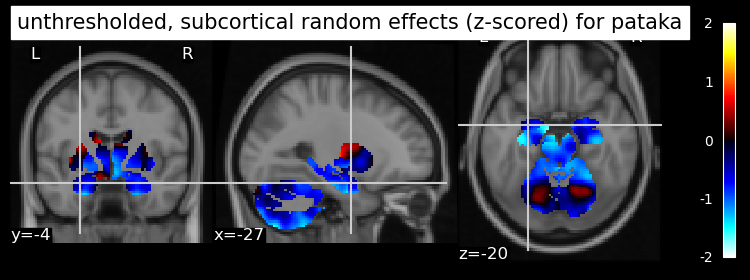

In [18]:
coord = [-27, -4, -20]
nplot.plot_stat_map(obj, bg_img=template,cut_coords=coord,
                    display_mode='ortho', #threshold=-threshold,
                    black_bg=True,
                    title=f'unthresholded, subcortical random effects (z-scored) for pataka')

In [ ]:
# def generate_zscore_cifti_object(thresholded_pool, task,sample_cifti_file='../../derivatives/fmriprep/sub-voice857/ses-1/smoothed/sub-voice857_ses-1_task-pataka_run-1_space-fsLR_den-91k_bold.dtseries.nii'):
#     #takes 91k np array of parcels and generates cifti object
    
#     sample_cifti = nimg.load_img(sample_cifti_file)
#     time_axis, brain_model_axis = [sample_cifti.header.get_axis(i) for i in range(sample_cifti.ndim)]
#     z = np.atleast_2d(thresholded_pool)
#     scalar_axis = nib.cifti2.ScalarAxis(['zscore'])  # Takes a list of names, one per row
#     new_header = nib.Cifti2Header.from_axes([scalar_axis, brain_model_axis])
#     #z = np.reshape(z, (-1, z.shape[0]))
#     img = nib.Cifti2Image(z, new_header)
    
# #     name = f'{task}_thresholded_pool.dtseries.nii'
#     name = f'{task}_thresholded_pool.dscalar.nii'
#     img.to_filename(name)
#     return name